## Coil 1
2 coil setup

### Comparison with existing code

Inner radius = 35.8 mm

Thickness = 2.4 mm

width = 5 mm

Br = 1.09 (remanence?)

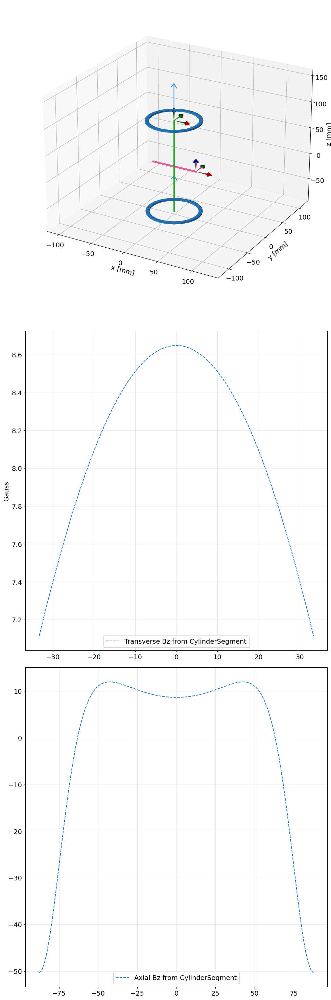

In [100]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as plticker
import magpylib as magpy
from magpylib.magnet import Cuboid, CylinderSegment

thickness = 2.4
dist = 87.7
innerrad = 33.354
width = 5
Br = 1.09
mT_to_T = 1e3
mT_to_G = 10
Br = Br * mT_to_T

fig_width = 10
fig = plt.figure(figsize=(fig_width,3*fig_width))
ax1 = fig.add_subplot(311, projection='3d', elev=24)
# ax1 = fig.add_subplot(121)
ax2 = fig.add_subplot(312)
ax3 = fig.add_subplot(313)
# ax1.view_init(elev=0, azim=0)
senzpos = 0
senpos_transverse = np.linspace((-innerrad,0,senzpos), (innerrad,0,senzpos), 5000)
sensor_1 = magpy.Sensor(position=senpos_transverse)

senpos_axial = np.linspace((0,0,-dist), (0,0,dist), 5000)
sensor_2 = magpy.Sensor(position=senpos_axial)

# plt.rcParams.update({'font.size': 22})
plt.rc('xtick', labelsize=20) 
plt.rc('ytick', labelsize=20) 

coll2 = magpy.Collection()
ring = CylinderSegment(magnetization=(0,0,Br), dimension=(innerrad, innerrad+width,thickness,0,360), position = (0,0,+dist))
ring2 = CylinderSegment(magnetization=(0,0,Br), dimension=(innerrad, innerrad+width,thickness,0,360), position = (0,0,-dist))
coll2.add(ring)
coll2.add(ring2)
# magpy.show(ring, sensor, canvas=ax2, style_magnetization_show=True)
magpy.show(coll2, sensor_1, sensor_2, canvas=ax1, style_magnetization_show=True)

# compare field at sensor
intervals = 0.1

# print(senpos_axial[:, 2])

s1B_z = sensor_1.getB(coll2).T[2]
s2B_z = sensor_2.getB(coll2).T[2]

G_transverse_z = s1B_z * mT_to_G
G_axial_z = s2B_z * mT_to_G

# ax2.set_xlim(-10, 10)
ax2.set_ylabel("Gauss")
ax2.plot(senpos_transverse[:, 0], G_transverse_z, ls='--', label='Transverse Bz from CylinderSegment')
ax2.grid(color='.9', which='major', axis='both', linestyle='-')
ax2.legend()


ax3.plot(senpos_axial[:, 2], G_axial_z, ls='--', label='Axial Bz from CylinderSegment')
ax3.grid(color='.9')
ax3.legend()

plt.tight_layout()
plt.show()

Maximum B-field along transverse 8.648 G


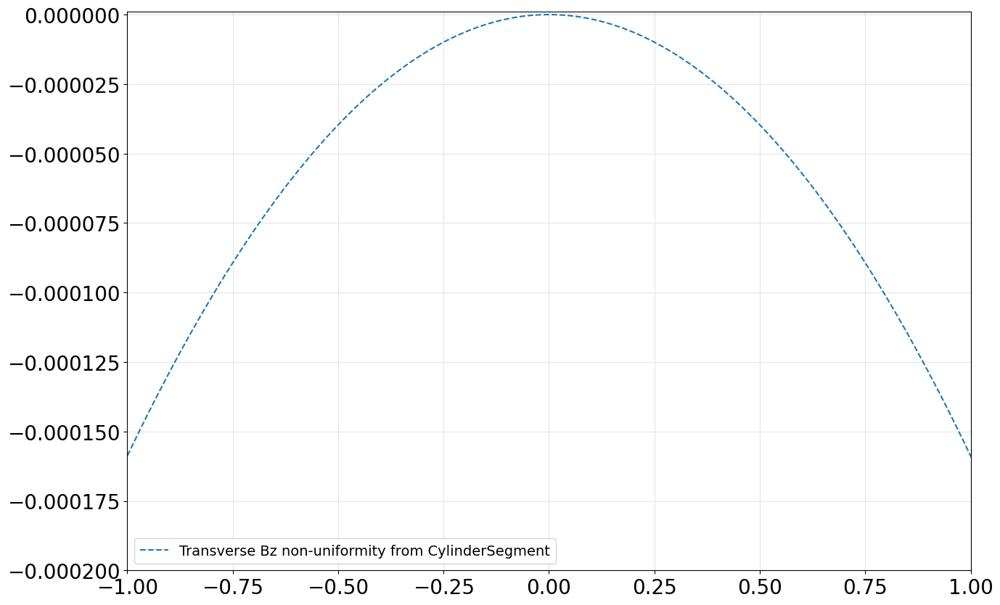

In [106]:
maxG_transverse = max(G_transverse_z)
print(f"Maximum B-field along transverse {round(maxG_transverse, 3)} G")
nonuniformity = (G_transverse_z - maxG_transverse) / maxG_transverse
plt.figure(figsize=(15, 10))
plt.xlim(-1, 1)
plt.ylim(-0.0002, 0.000001)
plt.plot(senpos_transverse[:, 0], nonuniformity, ls='--', label='Transverse Bz non-uniformity from CylinderSegment')
plt.grid(color='.9')
plt.legend()

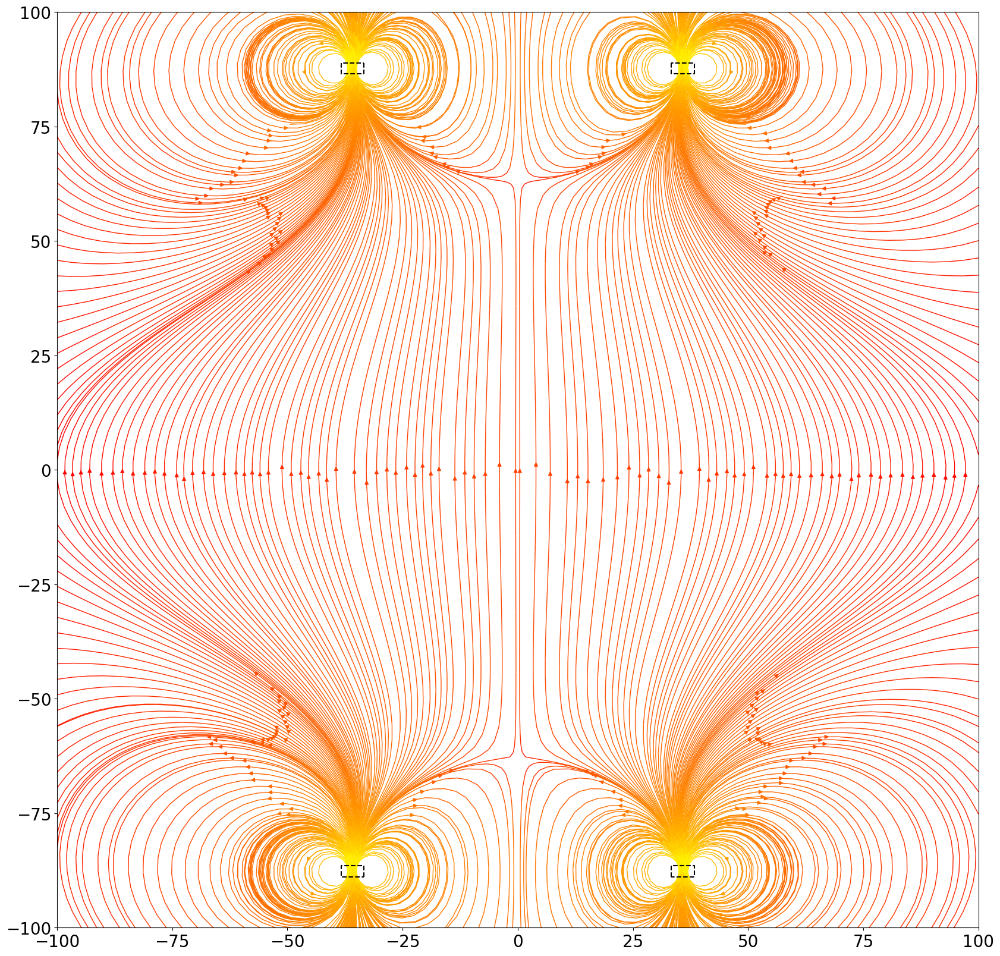

In [22]:
# coll2 = magpy.Collection()
# ring = CylinderSegment(magnetization=(0,0,Br), dimension=(innerrad, innerrad+width,thickness,0,360), position = (0,0,+dist))
# ring2 = CylinderSegment(magnetization=(0,0,Br), dimension=(innerrad, innerrad+width,thickness,0,360), position = (0,0,-dist))
# coll2.add(ring)
# coll2.add(ring2)
mags = coll2
x_bounds = [-100, 100]
z_bounds = [-100, 100]

outerrad = innerrad+width
nearsurface_z = dist - thickness/2
farsurface_z = dist + thickness/2
cross_section_2_coils = np.array([
    [[-innerrad,-innerrad,-outerrad,-outerrad,-innerrad], [farsurface_z,nearsurface_z,nearsurface_z,farsurface_z,farsurface_z]],
    [[innerrad,innerrad,outerrad,outerrad,innerrad], [farsurface_z,nearsurface_z,nearsurface_z,farsurface_z,farsurface_z]],
    [[-innerrad,-innerrad,-outerrad,-outerrad,-innerrad], [-farsurface_z,-nearsurface_z,-nearsurface_z,-farsurface_z,-farsurface_z]],
    [[innerrad,innerrad,outerrad,outerrad,innerrad], [-farsurface_z,-nearsurface_z,-nearsurface_z,-farsurface_z,-farsurface_z]]
])

make_flux_stream(mags, x_bounds, z_bounds, cross_section_2_coils)

In [76]:
"""
Plots flux stream in xz plane along y=0
magnets: collection of magnets used to determine B field
x_grid_bounds: 1x2 list to define x bounds for square grid, grid_bounds[0] is min bound, grid_bounds[1] is max bound
z_grid_bounds: 1x2 list to define z bounds for square grid, grid_bounds[0] is min bound, grid_bounds[1] is max bound

mag_draw_bounds: vertices to define magnet cross section polygon plot
             mag_draw_bounds[i][0] gives list of x-coords of ith polygon vertices
             mag_draw_bounds[i][1] gives list of z-coords of ith polygon vertices
"""

def make_flux_stream(magnets, x_grid_bounds, z_grid_bounds, mag_draw_bounds):
    ts_x = np.linspace(x_grid_bounds[0], x_grid_bounds[1], 100)
    ts_z = np.linspace(z_grid_bounds[0], z_grid_bounds[1], 100)
    grid = np.array([[(x,0,z) for x in ts_x] for z in ts_z])
    
    #get magnetic field
    B = magnets.getB(grid)
    
    #plot flux stream
    fig, ax1 = plt.subplots(1, 1, figsize=(20,20))
    ax1.streamplot(grid[:,:,0], grid[:,:,2], B[:,:,0], B[:,:,2], density=2,
        color=np.log(np.linalg.norm(B, axis=2)), linewidth=1, cmap='autumn', broken_streamlines=False)
    
    #plot coil cross section
    for poly in mag_draw_bounds:
        ax1.plot(poly[0], poly[1],'k--')

"""
Set up axial and transverse sensors and plots the B-field measured
"""
def get_field_on_axes(magnets, axial_sensor_length, transverse_sensor_length, uniformity_bound_t, uniformity_bound_ax):
    # define sensor and axis
    senpos_transverse = np.linspace((-transverse_sensor_length/2, 0, 0), (transverse_sensor_length/2, 0, 0), 5000)
    sen_t = magpy.Sensor(position=senpos_transverse)

    senpos_axial = np.linspace((0, 0, -axial_sensor_length/2), (0, 0, axial_sensor_length/2), 5000)
    sen_ax = magpy.Sensor(position=senpos_axial)
    
    # read from transverse and axial sensors
    Bz_t = sen_t.getB(magnets).T[2]
    Bz_ax = sen_ax.getB(magnets).T[2]

    # convert from returned mT readings to Gauss
    mT_to_G = 10
    Gz_t = Bz_t * mT_to_G
    Gz_ax = Bz_ax * mT_to_G
    
    # plotting
    plt.rc('xtick', labelsize=14) 
    plt.rc('ytick', labelsize=14)
    plt.rcParams.update({'font.size': 14})
    
    fig_width = 10
    fig = plt.figure(figsize=(fig_width, fig_width))
    ax1 = fig.add_subplot(321)
    ax2 = fig.add_subplot(322)
    ax3 = fig.add_subplot(323)
    ax4 = fig.add_subplot(324)
    ax5 = fig.add_subplot(325, projection='3d', elev=24)
    ax6 = fig.add_subplot(326, projection='3d', elev=24)
    ax6.view_init(elev=0, azim=0)
    
    ax1.set_ylabel("Gauss")
    ax1.plot(senpos_transverse[:, 0], Gz_t, ls='--', label='Transverse Bz from CylinderSegment')
    ax1.grid(color='.9', which='major', axis='both', linestyle='-')
    ax1.legend()

    ax2.plot(senpos_axial[:, 2], Gz_ax, ls='--', label='Axial Bz from CylinderSegment')
    ax2.grid(color='.9')
    ax2.legend()
    
    nonun_ax = get_nonuniformity(Gz_ax)
    nonun_t = get_nonuniformity(Gz_t)
    
    uniformity_bounds = 2
    
    xt = senpos_transverse[:, 0]
    # Get indices between uniformity bound range
    indices_xt = np.where(np.logical_and(xt>=uniformity_bound_t[0], xt<=uniformity_bound_t[1]))[0]
    clipped_nonun_t = np.take(nonun_t, indices_xt)
    min_nonun_t = np.min(clipped_nonun_t)
    max_nonun_t = np.max(clipped_nonun_t)
    print(f"Min transverse nonuniformity: {min_nonun_t}\nMax transverse nonuniformity:{max_nonun_t}")
    
    # Get clipped range for plot
    clipped_xt = np.take(xt, indices_xt)
    # Plot range corresponding to these indices
    ax3.plot(clipped_xt, clipped_nonun_t, ls='--',)
    ax3.grid(color='.9', which='major', axis='both', linestyle='-')
    ax3.set_ylim(min_nonun_t - 1e-7, max_nonun_t + 1e-7)
    
    
    xa = senpos_axial[:, 2]
    # Get indices between uniformity bound range
    indices_xa = np.where(np.logical_and(xa>=uniformity_bound_ax[0], xa<=uniformity_bound_ax[1]))[0]
    clipped_nonun_ax = np.take(nonun_ax, indices_xa)
    min_nonun_ax = np.min(clipped_nonun_ax)
    max_nonun_ax = np.max(clipped_nonun_ax)
    print(f"Min axial nonuniformity: {min_nonun_ax}\nMax axial nonuniformity:{max_nonun_ax}")
    
    # Get clipped range for plot
    clipped_xa = np.take(xa, indices_xa)
    # Plot range corresponding to these indices
    ax4.plot(clipped_xa, clipped_nonun_ax, ls='--',)
    ax4.grid(color='.9', which='major', axis='both', linestyle='-')
    ax4.set_ylim(min_nonun_ax - 1e-7, max_nonun_ax + 1e-7)
    
    magpy.show(magnets, sen_ax, sen_t, canvas=ax5, style_magnetization_show=True)
    magpy.show(magnets, sen_ax, sen_t, canvas=ax6, style_magnetization_show=True)

    plt.tight_layout()
    plt.show()

# return nonuniformity about central point
def get_nonuniformity(G_measured):
    maxG = max(G_measured)
    G_center = G_measured.item(int(len(G_measured)/2))
    
    print(f"Maximum B-field along sensor direction: {round(maxG, 3)} G")
    print(f"Central B-field along transverse axis: {round(G_center, 3)} G")
    nonuniformity = (G_measured - G_center) / G_center
    return nonuniformity

## Coil 2
Maxwell 3 coil setup

Maximum B-field along sensor direction: -19.289 G
Central B-field along transverse axis: -19.289 G
Maximum B-field along sensor direction: -13.196 G
Central B-field along transverse axis: -19.289 G
Min transverse nonuniformity: -0.03393259522671076
Max transverse nonuniformity:-0.0
Min axial nonuniformity: -0.0
Max axial nonuniformity:0.2852221599617035


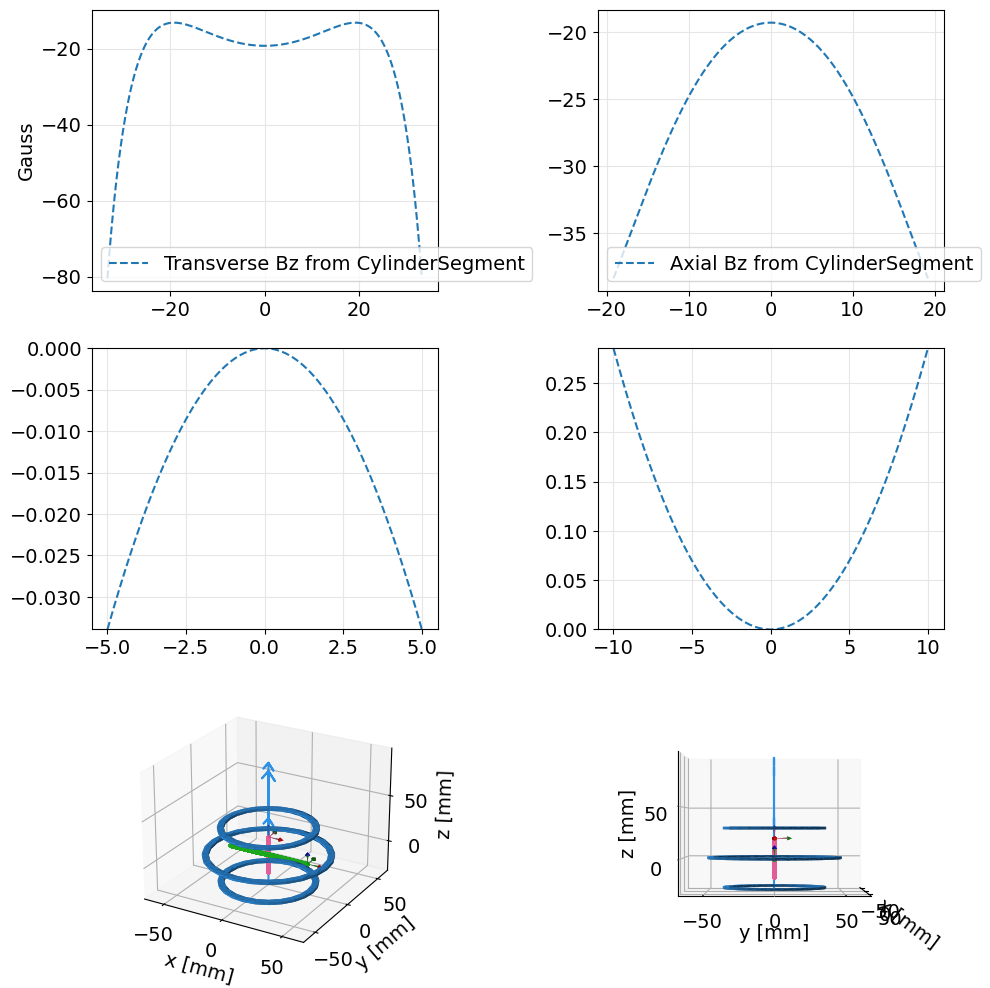

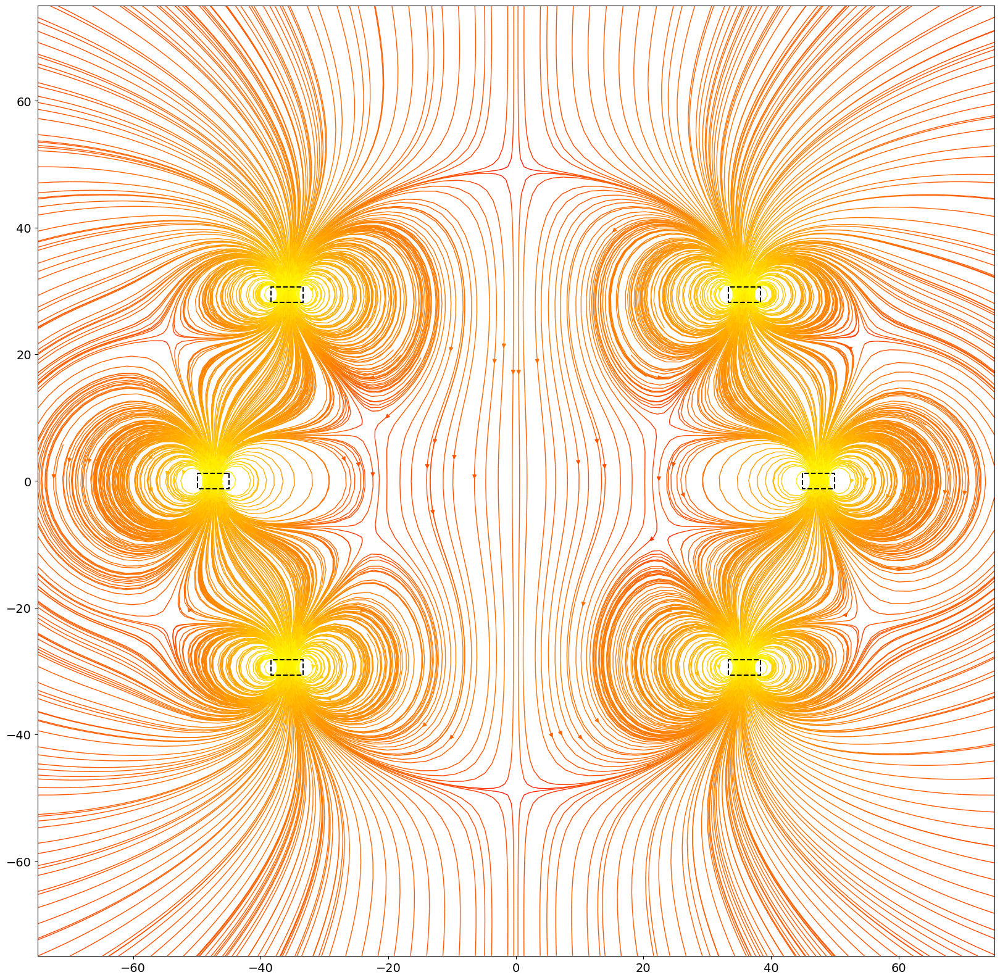

In [98]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as plticker
import magpylib as magpy
from magpylib.magnet import Cuboid, CylinderSegment


thickness = 2.4
width = 5
innerrad = 33.354
#inner radius of middle coil
innerrad_mid = np.sqrt(7/4) * (innerrad + width/2) - width/2
maxwell_dist = np.sqrt(3/7) * innerrad_mid
Br = 1.09e3 # in mT
mT_to_T = 1e3
mT_to_G = 10

# define rings in maxwell coil
maxwell3 = magpy.Collection()
ring_top = CylinderSegment(magnetization=(0, 0, Br),
                           dimension=(innerrad, innerrad + width, thickness, 0, 360),
                           position = (0, 0, +maxwell_dist))
ring_bot = CylinderSegment(magnetization=(0, 0, Br),
                           dimension=(innerrad_mid, innerrad_mid + width, thickness, 0, 360),
                           position = (0, 0, 0))
ring_mid = CylinderSegment(magnetization=(0, 0, Br),
                           dimension=(innerrad, innerrad + width, thickness, 0, 360),
                           position = (0, 0, -maxwell_dist))
maxwell3.add(ring_top).add(ring_bot).add(ring_mid)

get_field_on_axes(maxwell3, dist*2, innerrad*2, [-5,5], [-10,10])

x_bounds = [-75, 75]
z_bounds = [-75, 75]
outerrad = innerrad + width
nearsurface_z = maxwell_dist - thickness/2
farsurface_z = maxwell_dist + thickness/2

outerrad_mid = innerrad_mid + width

cross_section_3_coils = np.array([
    [[-innerrad,-innerrad,-outerrad,-outerrad,-innerrad], [farsurface_z,nearsurface_z,nearsurface_z,farsurface_z,farsurface_z]],
    [[innerrad,innerrad,outerrad,outerrad,innerrad], [farsurface_z,nearsurface_z,nearsurface_z,farsurface_z,farsurface_z]],
    [[-innerrad,-innerrad,-outerrad,-outerrad,-innerrad], [-farsurface_z,-nearsurface_z,-nearsurface_z,-farsurface_z,-farsurface_z]],
    [[innerrad,innerrad,outerrad,outerrad,innerrad], [-farsurface_z,-nearsurface_z,-nearsurface_z,-farsurface_z,-farsurface_z]],
    [[-innerrad_mid,-innerrad_mid,-outerrad_mid,-outerrad_mid,-innerrad_mid], [thickness/2,-thickness/2,-thickness/2,thickness/2,thickness/2]],
    [[innerrad_mid,innerrad_mid,outerrad_mid,outerrad_mid,innerrad_mid], [thickness/2,-thickness/2,-thickness/2,thickness/2,thickness/2]],
])
make_flux_stream(maxwell3, x_bounds, z_bounds, cross_section_3_coils)

## Stacked disk configuration

Same outer radius R
Separated by R

Maximum B-field along sensor direction: 488.047 G
Central B-field along transverse axis: 488.047 G
Maximum B-field along sensor direction: 488.048 G
Central B-field along transverse axis: 488.047 G
Min transverse nonuniformity: -0.00010641101472039922
Max transverse nonuniformity:7.36596569707656e-07
Min axial nonuniformity: -0.005049887803444442
Max axial nonuniformity:0.0


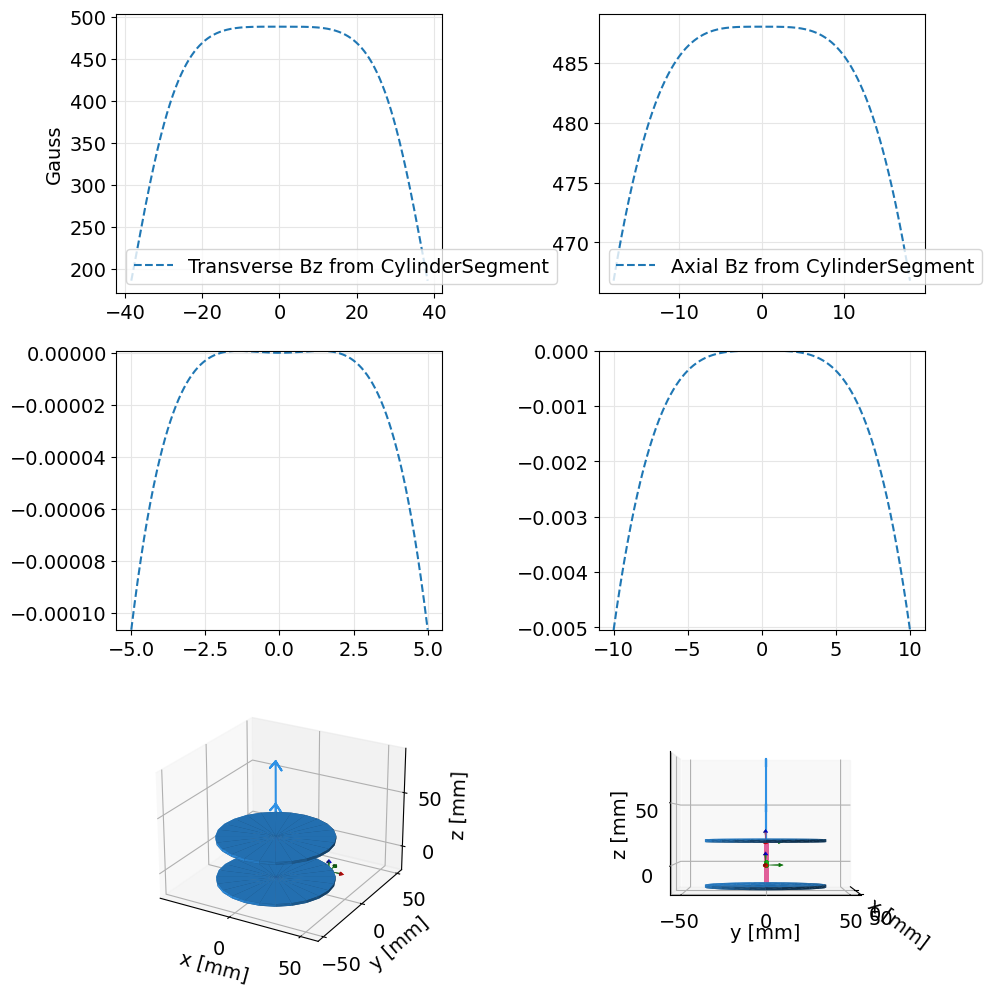

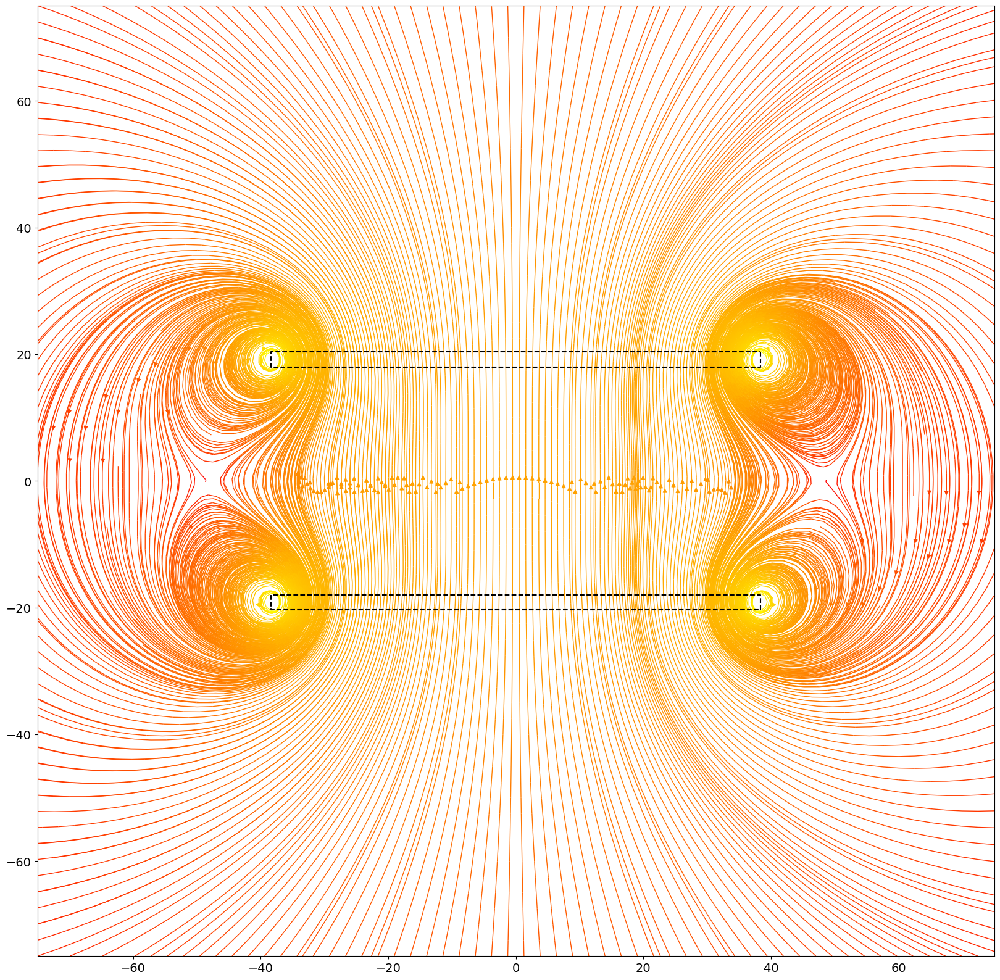

In [99]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as plticker
import magpylib as magpy
from magpylib.magnet import Cuboid, CylinderSegment


thickness = 2.4
innerrad = 0
outerrad = 38.354
dist = outerrad / 2
Br = 1.09e3 # in mT
mT_to_T = 1e3
mT_to_G = 10

# define rings in maxwell coil
disk2 = magpy.Collection()
disk_top = CylinderSegment(magnetization=(0, 0, Br),
                           dimension=(innerrad, outerrad, thickness, 0, 360),
                           position = (0, 0, +dist))
disk_bot = CylinderSegment(magnetization=(0, 0, Br),
                           dimension=(innerrad, outerrad, thickness, 0, 360),
                           position = (0, 0, -dist))
disk2.add(disk_top).add(disk_bot)

get_field_on_axes(disk2, 2*(dist-thickness/2), outerrad*2, [-5, 5], [-10, 10])

x_bounds = [-75, 75]
z_bounds = [-75, 75]
nearsurface_z =  dist - thickness/2
farsurface_z = dist + thickness/2

cross_section_disk2 = np.array([
    [[outerrad,outerrad,-outerrad,-outerrad,outerrad], [farsurface_z,nearsurface_z,nearsurface_z,farsurface_z,farsurface_z]],
    [[outerrad,outerrad,-outerrad,-outerrad,outerrad], [-farsurface_z,-nearsurface_z,-nearsurface_z,-farsurface_z,-farsurface_z]],
])
make_flux_stream(disk2, x_bounds, z_bounds, cross_section_disk2)

Maximum B-field along sensor direction: 203.353 G
Central B-field along transverse axis: 203.353 G
Maximum B-field along sensor direction: 203.353 G
Central B-field along transverse axis: 203.353 G
Min transverse nonuniformity: -0.002104446539916603
Max transverse nonuniformity:2.2176636211455694e-08
Min axial nonuniformity: -0.004947138009371283
Max axial nonuniformity:0.0


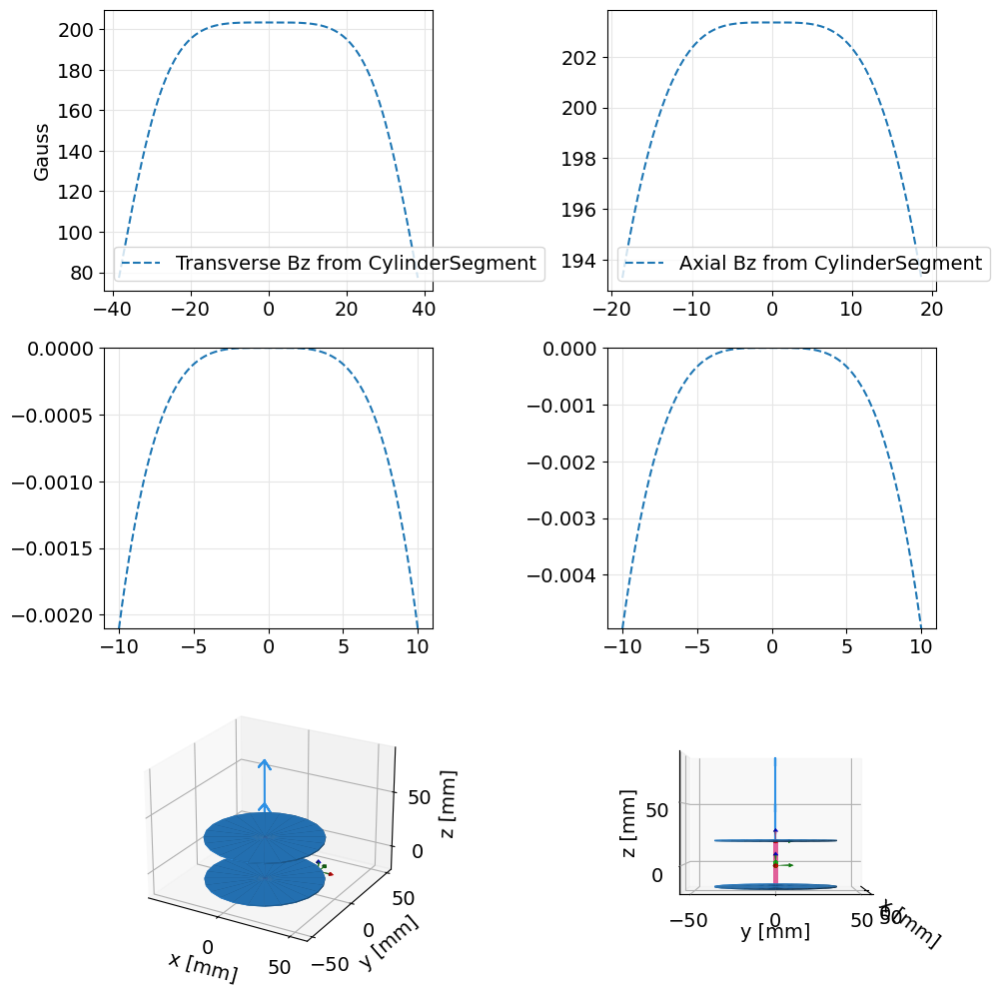

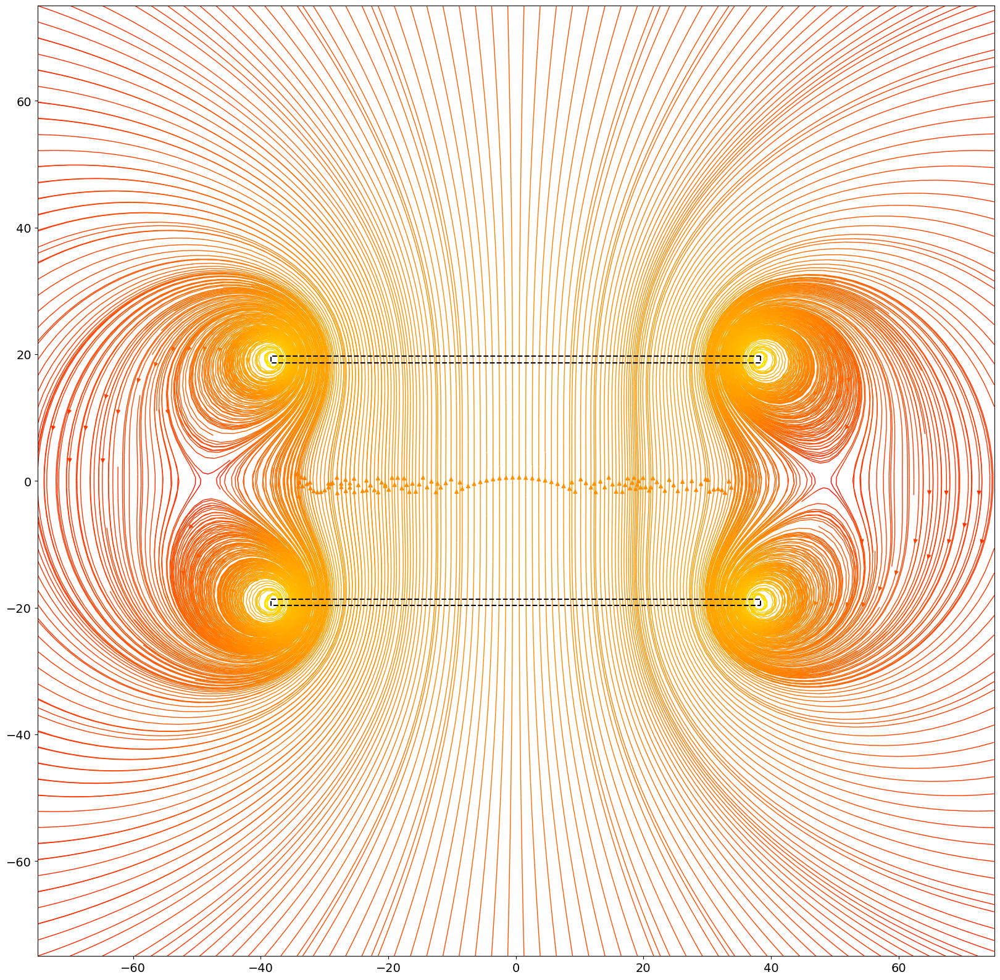

In [96]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as plticker
import magpylib as magpy
from magpylib.magnet import Cuboid, CylinderSegment


thickness = 1
innerrad = 0
outerrad = 38.354
dist = outerrad/2
Br = 1.09e3 # in mT
mT_to_T = 1e3
mT_to_G = 10

# define rings in maxwell coil
disk2 = magpy.Collection()
disk_top = CylinderSegment(magnetization=(0, 0, Br),
                           dimension=(innerrad, outerrad, thickness, 0, 360),
                           position = (0, 0, +dist))
disk_bot = CylinderSegment(magnetization=(0, 0, Br),
                           dimension=(innerrad, outerrad, thickness, 0, 360),
                           position = (0, 0, -dist))
disk2.add(disk_top).add(disk_bot)

get_field_on_axes(disk2, 2*(dist-thickness/2), outerrad*2, [-10, 10], [-10, 10])

x_bounds = [-75, 75]
z_bounds = [-75, 75]
nearsurface_z =  dist - thickness/2
farsurface_z = dist + thickness/2

cross_section_disk2 = np.array([
    [[outerrad,outerrad,-outerrad,-outerrad,outerrad], [farsurface_z,nearsurface_z,nearsurface_z,farsurface_z,farsurface_z]],
    [[outerrad,outerrad,-outerrad,-outerrad,outerrad], [-farsurface_z,-nearsurface_z,-nearsurface_z,-farsurface_z,-farsurface_z]],
])
make_flux_stream(disk2, x_bounds, z_bounds, cross_section_disk2)

## Maciej coil

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as plticker
import magpylib as magpy
from magpylib.magnet import Cuboid, CylinderSegment


thickness = 1
innerrad = 0
outerrad = 84
dist = outerrad/2
Br = 1.09e3 # in mT
mT_to_T = 1e3
mT_to_G = 10

# define rings in maciej coil
disk2 = magpy.Collection()
disk_top = CylinderSegment(magnetization=(0, 0, Br),
                           dimension=(innerrad, outerrad, thickness, 0, 360),
                           position = (0, 0, +dist))
disk_bot = CylinderSegment(magnetization=(0, 0, Br),
                           dimension=(innerrad, outerrad, thickness, 0, 360),
                           position = (0, 0, -dist))
disk2.add(disk_top).add(disk_bot)

get_field_on_axes(disk2, 2*(dist-thickness/2), outerrad*2, [-10, 10], [-10, 10])

x_bounds = [-75, 75]
z_bounds = [-75, 75]
nearsurface_z =  dist - thickness/2
farsurface_z = dist + thickness/2

cross_section_disk2 = np.array([
    [[outerrad,outerrad,-outerrad,-outerrad,outerrad], [farsurface_z,nearsurface_z,nearsurface_z,farsurface_z,farsurface_z]],
    [[outerrad,outerrad,-outerrad,-outerrad,outerrad], [-farsurface_z,-nearsurface_z,-nearsurface_z,-farsurface_z,-farsurface_z]],
])
make_flux_stream(disk2, x_bounds, z_bounds, cross_section_disk2)

## Archive

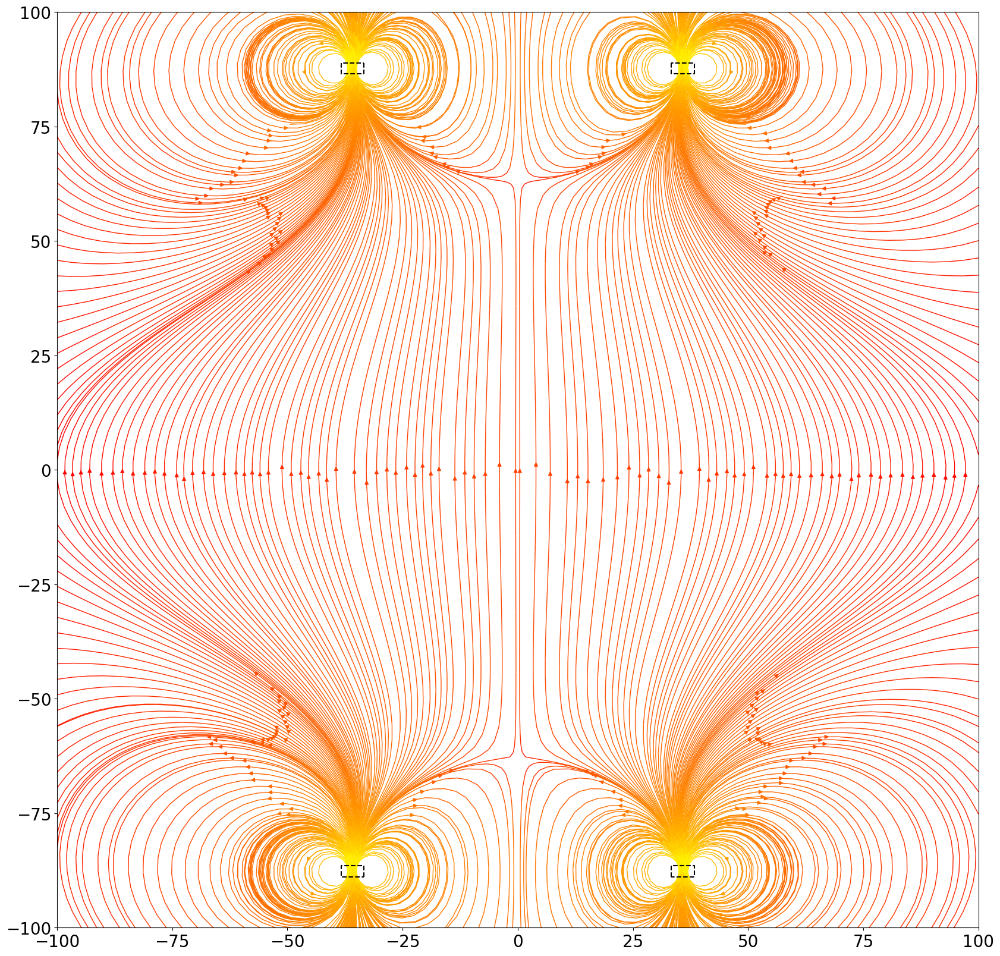

In [184]:
# create an observer grid in the xz-symmetry plane
ts = np.linspace(-100, 100, 100)
grid = np.array([[(x,0,z) for x in ts] for z in ts])

# compute B- and H-fields of a cuboid magnet on the grid
# cube = magpy.magnet.Cuboid(magnetization=(500,0,500), dimension=(2,2,2))
# B = cube.getB(grid)
B = coll2.getB(grid)
lw = 5*B / B.max()
# Mark boundaries of coil
outerrad = innerrad+width
nearsurface_z = dist - thickness/2
farsurface_z = dist + thickness/2
    
# display field with Pyplot
fig, ax1= plt.subplots(1, 1, figsize=(20,20))
ax1.streamplot(grid[:,:,0], grid[:,:,2], B[:,:,0], B[:,:,2], density=2,
    color=np.log(np.linalg.norm(B, axis=2)), linewidth=1, cmap='autumn', broken_streamlines=False)
# ax1.streamplot(grid[:,:,0], grid[:,:,2], B[:,:,0], B[:,:,2], density=2,
#     color=np.log(np.linalg.norm(B, axis=2)), linewidth=1, cmap='autumn')

for ax in [ax1]:
    ax.plot([-innerrad,-innerrad,-outerrad,-outerrad,-innerrad], [farsurface_z,nearsurface_z,nearsurface_z,farsurface_z,farsurface_z], 'k--')
    ax.plot([innerrad,innerrad,outerrad,outerrad,innerrad], [farsurface_z,nearsurface_z,nearsurface_z,farsurface_z,farsurface_z], 'k--')
    ax.plot([-innerrad,-innerrad,-outerrad,-outerrad,-innerrad], [-farsurface_z,-nearsurface_z,-nearsurface_z,-farsurface_z,-farsurface_z], 'k--')
    ax.plot([innerrad,innerrad,outerrad,outerrad,innerrad], [-farsurface_z,-nearsurface_z,-nearsurface_z,-farsurface_z,-farsurface_z], 'k--')

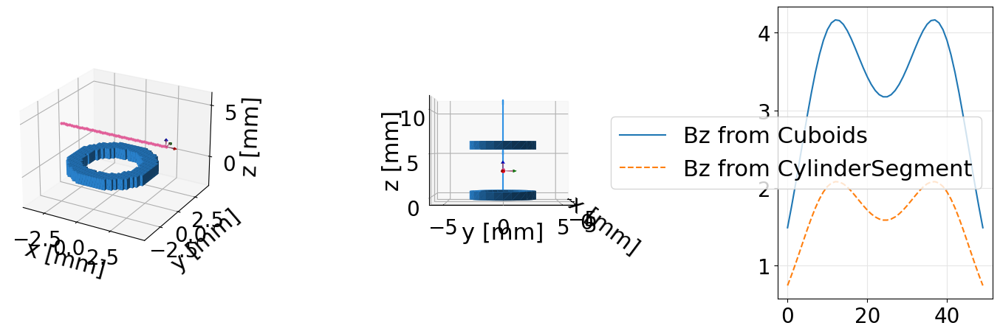

In [102]:
import numpy as np
import matplotlib.pyplot as plt
import magpylib as magpy
from magpylib.magnet import Cuboid, CylinderSegment

fig = plt.figure(figsize=(14,5))
ax1 = fig.add_subplot(131, projection='3d', elev=24)
ax2 = fig.add_subplot(132, projection='3d', elev=24)
ax2.view_init(elev=0, azim=0)
ax3 = fig.add_subplot(133)

sensor = magpy.Sensor(position=np.linspace((-4,0,3), (4,0,3), 50))

# ring with cuboid shapes
ts = np.linspace(-3, 3, 31)
grid = [(x,y,0) for x in ts for y in ts]

coll = magpy.Collection()
for pos in grid:
    r = np.sqrt(pos[0]**2 + pos[1]**2)
    if 2<r<3:
        coll.add(Cuboid(magnetization=(0,0,100), dimension=(.2,.2,1), position=pos))
magpy.show(coll, sensor, canvas=ax1, style_magnetization_show=False)

# ring with CylinderSegment
coll2 = magpy.Collection()
ring = CylinderSegment(magnetization=(0,0,100), dimension=(2,3,1,0,360), position = (0,0,0))
ring2 = CylinderSegment(magnetization=(0,0,100), dimension=(2,3,1,0,360), position = (0,0,6))
coll2.add(ring)
coll2.add(ring2)
# magpy.show(ring, sensor, canvas=ax2, style_magnetization_show=True)
magpy.show(coll2, sensor, canvas=ax2, style_magnetization_show=True)

# compare field at sensor
ax3.plot(sensor.getB(coll2).T[2], label='Bz from Cuboids')
ax3.plot(sensor.getB(ring).T[2], ls='--', label='Bz from CylinderSegment')
ax3.grid(color='.9')
ax3.legend()

plt.tight_layout()
plt.show()